# Comprehensive EDA: Boston Housing Dataset

This notebook provides a complete exploratory data analysis of the Boston Housing dataset with:
- Data quality checks
- Univariate and bivariate analysis
- Multivariate exploration
- Geographic visualization
- Outlier detection
- Feature engineering
- Statistical tests
- Key insights generation

## Load Required Libraries

In [3]:
# Install packages if needed (uncomment if required)
# install.packages('IRkernel')
# install.packages(c('mlbench', 'ggplot2', 'dplyr', 'tidyr', 'corrplot', 'gridExtra', 'scales', 'psych', 'car', 'moments', 'GGally', 'viridis'))

# Load libraries
library(mlbench)
library(ggplot2)
library(dplyr)
library(tidyr)
library(corrplot)
library(gridExtra)
library(scales)
library(psych)
library(car)
library(moments)
library(viridis)

Loading required package: viridisLite


Attaching package: ‘viridis’


The following object is masked from ‘package:scales’:

    viridis_pal




## Load Dataset

In [4]:
data("BostonHousing2", package = "mlbench")
boston <- BostonHousing2

## 1. Data Structure & Quality Checks

In [5]:
cat("=== DATA STRUCTURE ===\n")
str(boston)
cat("\n=== DIMENSIONS ===\n")
cat(paste("Rows:", nrow(boston), "| Columns:", ncol(boston), "\n"))

=== DATA STRUCTURE ===
'data.frame':	506 obs. of  19 variables:
 $ town   : Factor w/ 92 levels "Arlington","Ashland",..: 54 77 77 46 46 46 69 69 69 69 ...
 $ tract  : int  2011 2021 2022 2031 2032 2033 2041 2042 2043 2044 ...
 $ lon    : num  -71 -71 -70.9 -70.9 -70.9 ...
 $ lat    : num  42.3 42.3 42.3 42.3 42.3 ...
 $ medv   : num  24 21.6 34.7 33.4 36.2 28.7 22.9 27.1 16.5 18.9 ...
 $ cmedv  : num  24 21.6 34.7 33.4 36.2 28.7 22.9 22.1 16.5 18.9 ...
 $ crim   : num  0.00632 0.02731 0.02729 0.03237 0.06905 ...
 $ zn     : num  18 0 0 0 0 0 12.5 12.5 12.5 12.5 ...
 $ indus  : num  2.31 7.07 7.07 2.18 2.18 2.18 7.87 7.87 7.87 7.87 ...
 $ chas   : Factor w/ 2 levels "0","1": 1 1 1 1 1 1 1 1 1 1 ...
 $ nox    : num  0.538 0.469 0.469 0.458 0.458 0.458 0.524 0.524 0.524 0.524 ...
 $ rm     : num  6.58 6.42 7.18 7 7.15 ...
 $ age    : num  65.2 78.9 61.1 45.8 54.2 58.7 66.6 96.1 100 85.9 ...
 $ dis    : num  4.09 4.97 4.97 6.06 6.06 ...
 $ rad    : int  1 2 2 3 3 3 5 5 5 5 ...
 $ tax    :

In [6]:
cat("\n=== FIRST FEW ROWS ===\n")
head(boston)


=== FIRST FEW ROWS ===


,town,tract,lon,lat,medv,cmedv,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>
1,Nahant,2011,-70.9550,42.2550,24.0,24.0,0.00632,18,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98
2,Swampscott,2021,-70.9500,42.2875,21.6,21.6,0.02731,0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14
3,Swampscott,2022,-70.9360,42.2830,34.7,34.7,0.02729,0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03
4,Marblehead,2031,-70.9280,42.2930,33.4,33.4,0.03237,0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94
5,Marblehead,2032,-70.9220,42.2980,36.2,36.2,0.06905,0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33
6,Marblehead,2033,-70.9165,42.3040,28.7,28.7,0.02985,0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,394.12,5.21


In [7]:
cat("\n=== MISSING VALUES ===\n")
missing_summary <- data.frame(
  Variable = names(boston),
  Missing_Count = sapply(boston, function(x) sum(is.na(x))),
  Missing_Percent = sapply(boston, function(x) round(100 * sum(is.na(x)) / length(x), 2))
)
print(missing_summary[missing_summary$Missing_Count > 0, ])


=== MISSING VALUES ===
[1] Variable        Missing_Count   Missing_Percent
<0 rows> (or 0-length row.names)


In [8]:
cat("\n=== DUPLICATE ROWS ===\n")
cat(paste("Number of duplicate rows:", sum(duplicated(boston)), "\n"))

cat("\n=== DATA TYPES ===\n")
print(sapply(boston, class))


=== DUPLICATE ROWS ===


Number of duplicate rows: 0 

=== DATA TYPES ===
     town     tract       lon       lat      medv     cmedv      crim        zn 
 "factor" "integer" "numeric" "numeric" "numeric" "numeric" "numeric" "numeric" 
    indus      chas       nox        rm       age       dis       rad       tax 
"numeric"  "factor" "numeric" "numeric" "numeric" "numeric" "integer" "integer" 
  ptratio         b     lstat 
"numeric" "numeric" "numeric" 


## 2. Univariate Analysis - Numerical Variables

In [21]:
# Summary Statistics for Numerical Variables
numerical_vars <- boston %>% select_if(is.numeric) %>% select(-tract, -lat, -lon, -medv)
cat("\n=== SUMMARY STATISTICS ===\n")
print(summary(numerical_vars))


=== SUMMARY STATISTICS ===
     cmedv            crim                zn             indus      
 Min.   : 5.00   Min.   : 0.00632   Min.   :  0.00   Min.   : 0.46  
 1st Qu.:17.02   1st Qu.: 0.08205   1st Qu.:  0.00   1st Qu.: 5.19  
 Median :21.20   Median : 0.25651   Median :  0.00   Median : 9.69  
 Mean   :22.53   Mean   : 3.61352   Mean   : 11.36   Mean   :11.14  
 3rd Qu.:25.00   3rd Qu.: 3.67708   3rd Qu.: 12.50   3rd Qu.:18.10  
 Max.   :50.00   Max.   :88.97620   Max.   :100.00   Max.   :27.74  
      nox               rm             age              dis        
 Min.   :0.3850   Min.   :3.561   Min.   :  2.90   Min.   : 1.130  
 1st Qu.:0.4490   1st Qu.:5.886   1st Qu.: 45.02   1st Qu.: 2.100  
 Median :0.5380   Median :6.208   Median : 77.50   Median : 3.207  
 Mean   :0.5547   Mean   :6.285   Mean   : 68.57   Mean   : 3.795  
 3rd Qu.:0.6240   3rd Qu.:6.623   3rd Qu.: 94.08   3rd Qu.: 5.188  
 Max.   :0.8710   Max.   :8.780   Max.   :100.00   Max.   :12.127  
      rad    

In [22]:
skew_kurt <- data.frame(
  Variable = names(numerical_vars),
  Skewness = sapply(numerical_vars, skewness, na.rm = TRUE),
  Kurtosis = sapply(numerical_vars, kurtosis, na.rm = TRUE)
)
print(dplyr::mutate_if(skew_kurt, is.numeric, round, digits = 3))

        Variable Skewness Kurtosis
cmedv      cmedv    1.108    4.490
crim        crim    5.208   39.753
zn            zn    2.219    6.980
indus      indus    0.294    1.767
nox          nox    0.727    2.924
rm            rm    0.402    4.861
age          age   -0.597    2.030
dis          dis    1.009    3.471
rad          rad    1.002    2.129
tax          tax    0.668    1.857
ptratio  ptratio   -0.800    2.706
b              b   -2.882   10.144
lstat      lstat    0.904    3.477


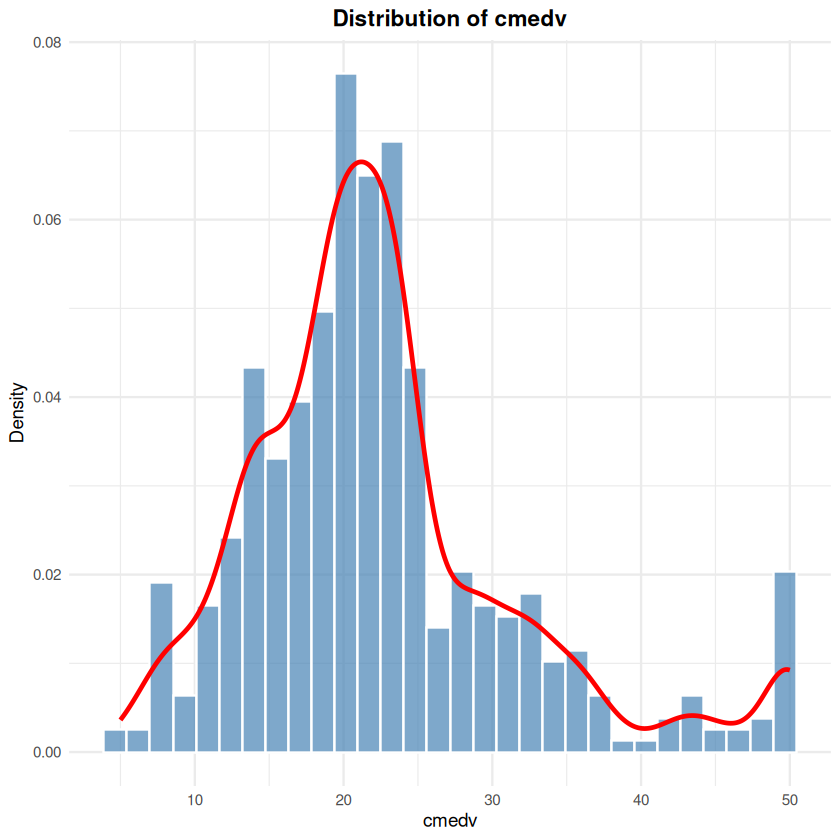

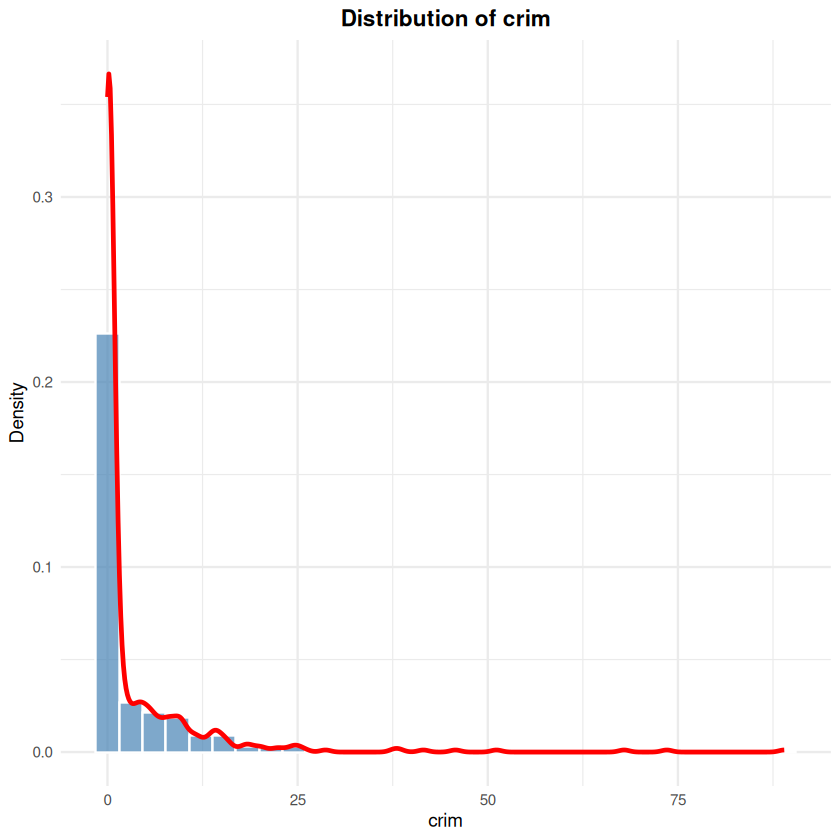

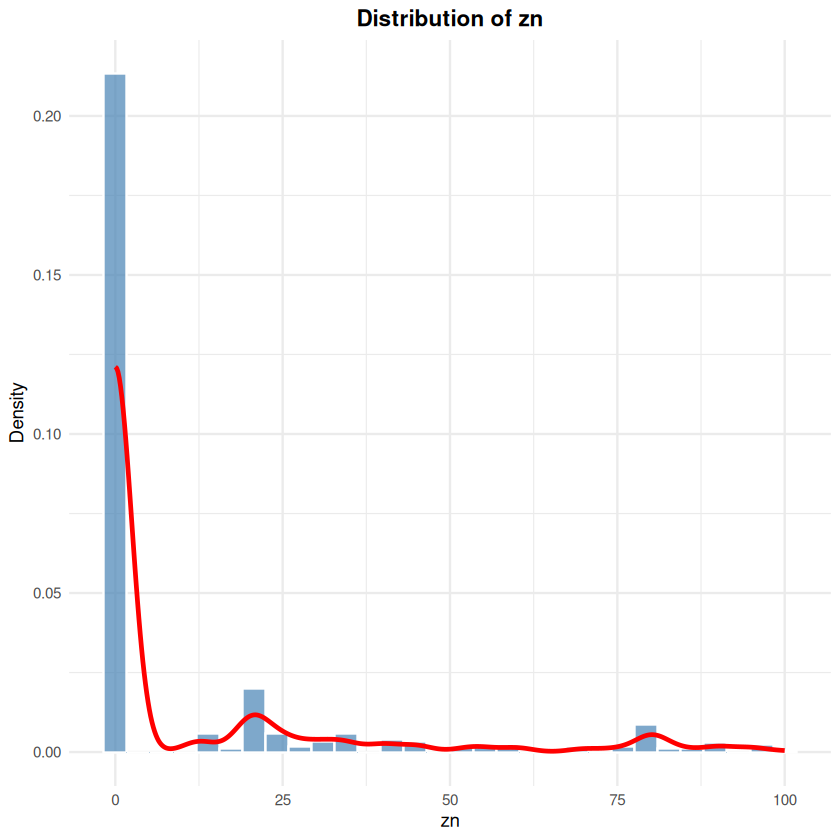

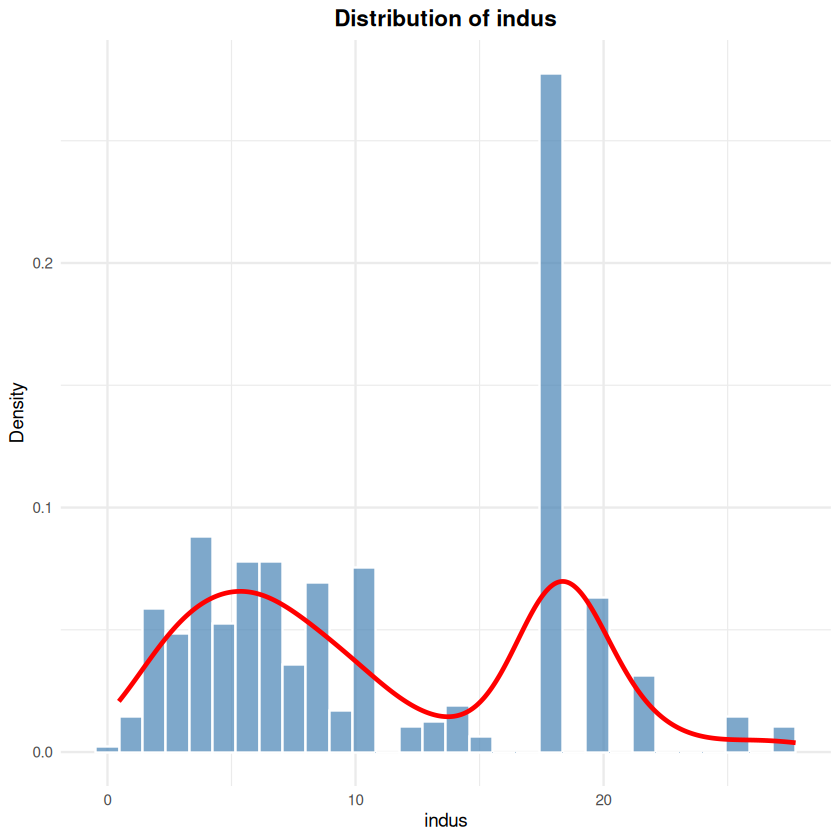

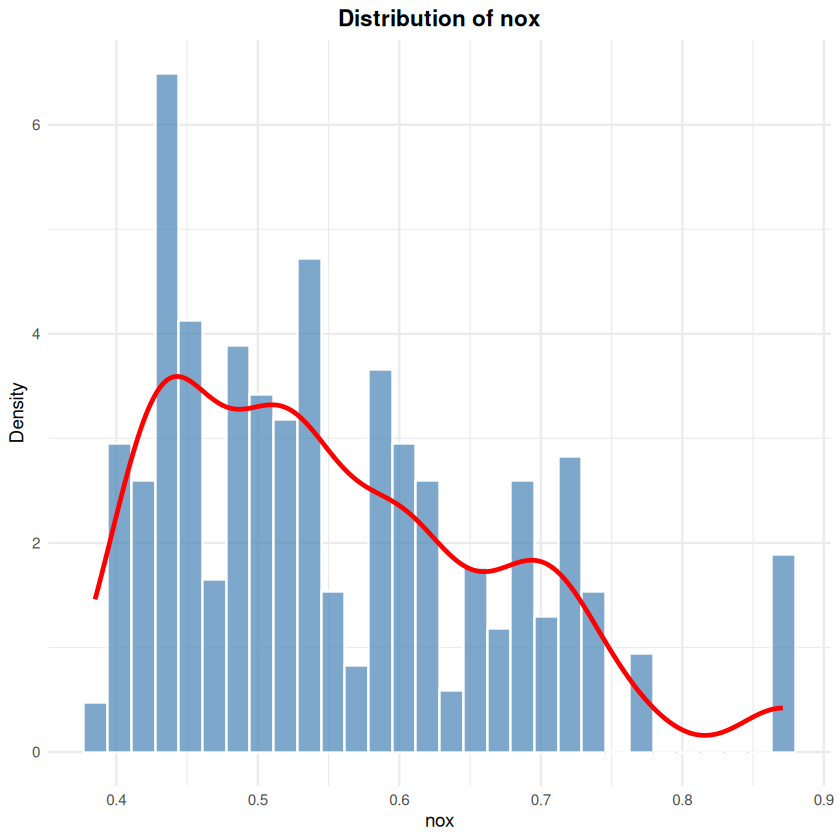

...

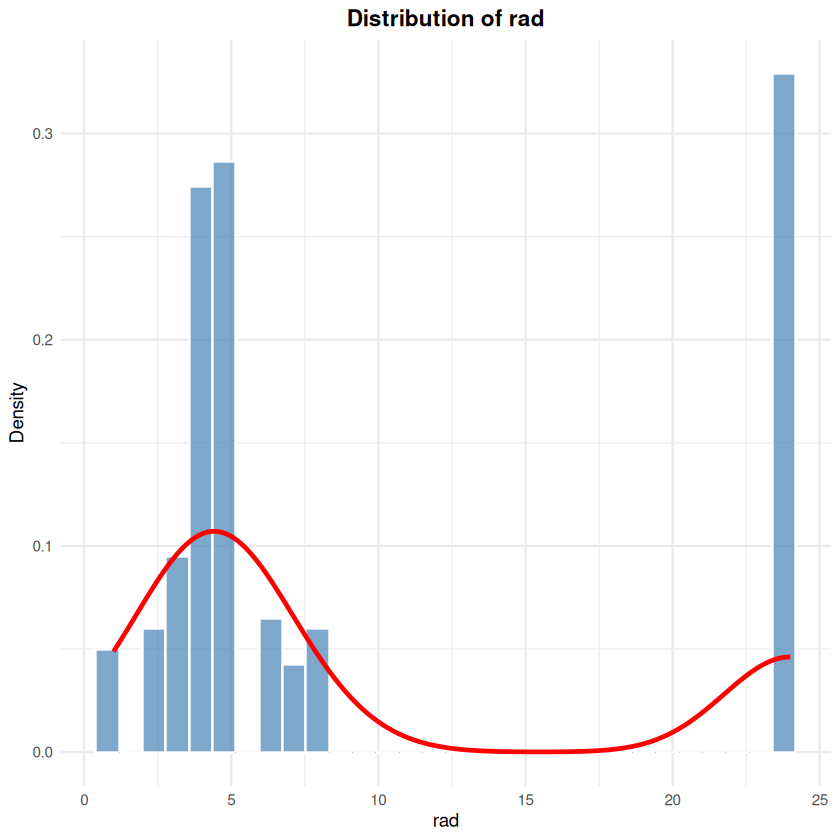

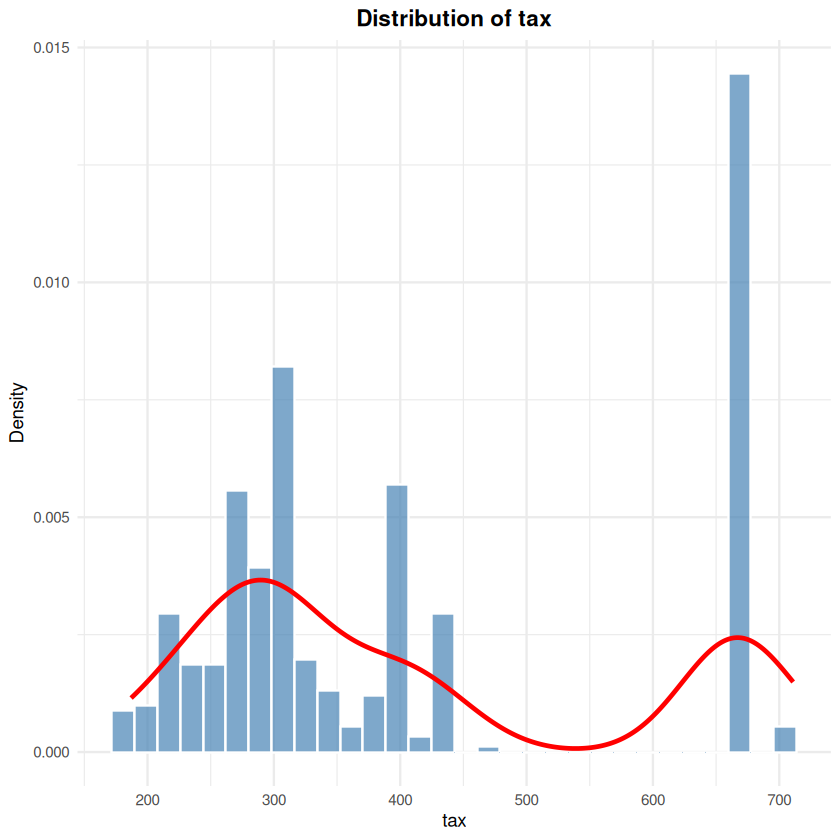

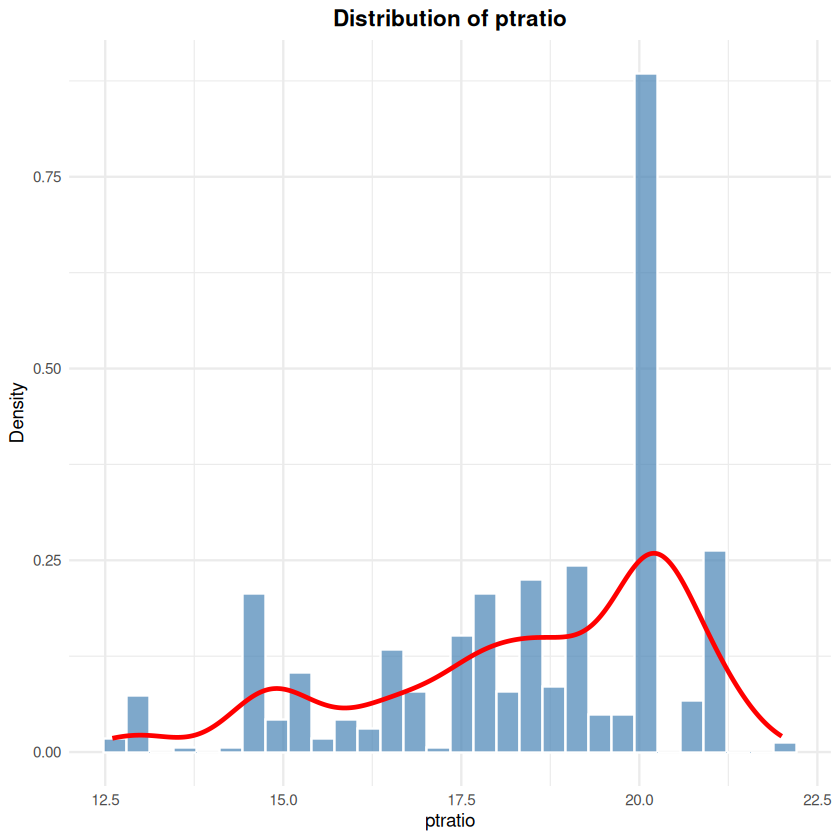

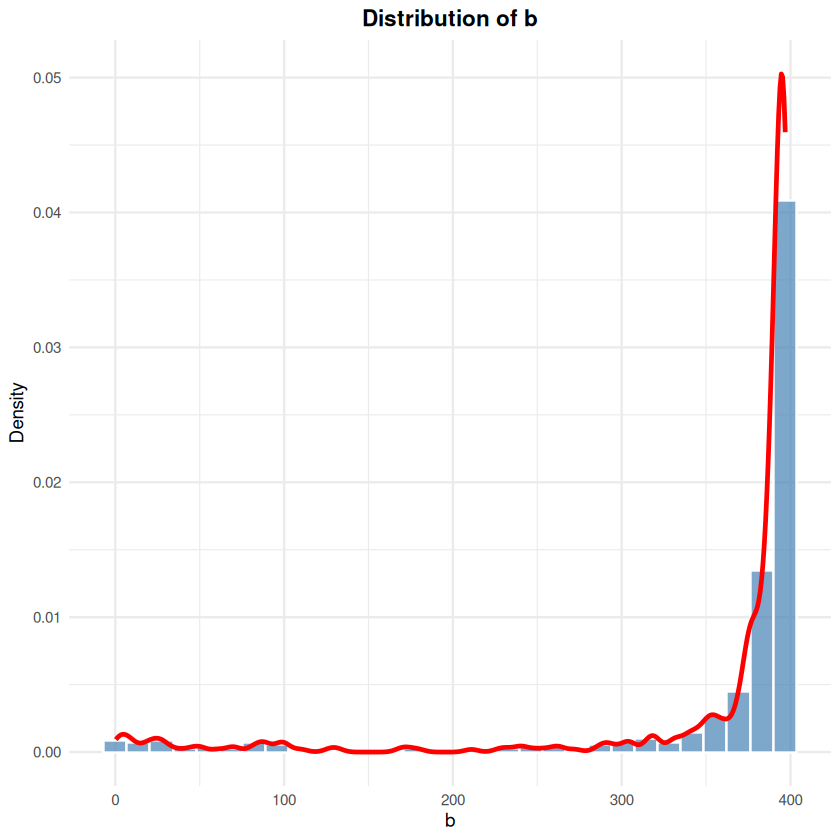

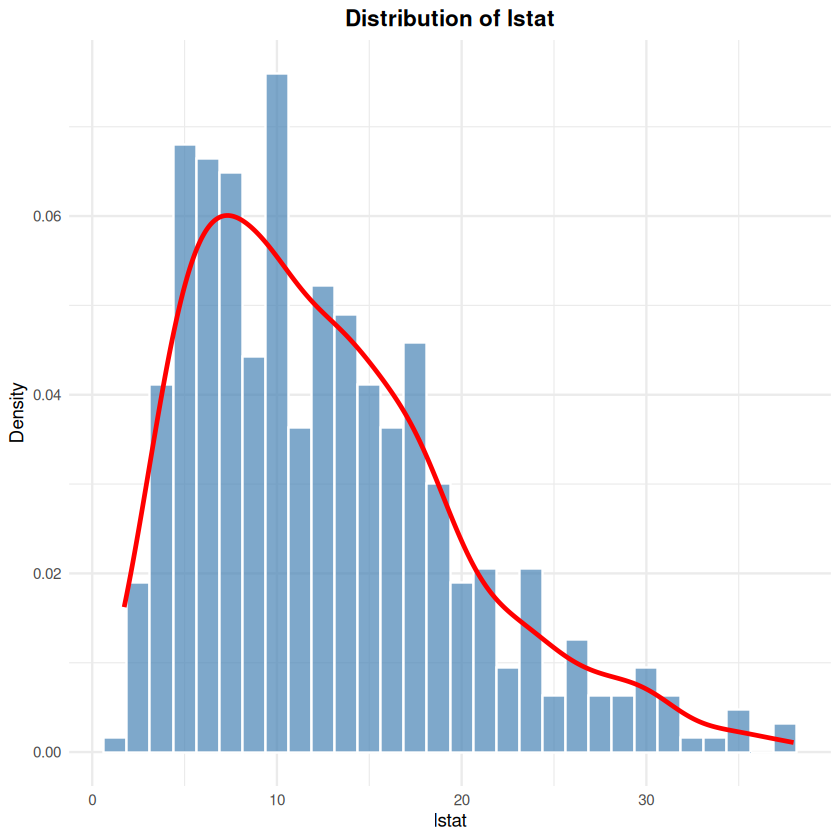

In [23]:
# Distributions with Histograms and Density Plots
plot_list <- list()
for (var in names(numerical_vars)[1:ncol(numerical_vars)]) {
  p <- ggplot(boston, aes_string(x = var)) +
    geom_histogram(aes(y = after_stat(density)), bins = 30, fill = "steelblue", alpha = 0.7, color = "white") +
    geom_density(color = "red", linewidth = 1) +
    labs(title = paste("Distribution of", var), x = var, y = "Density") +
    theme_minimal() +
    theme(plot.title = element_text(hjust = 0.5, face = "bold"))
  plot_list[[var]] <- p
}

# Display all plots one after the other
for (p in plot_list) {
  print(p)
}

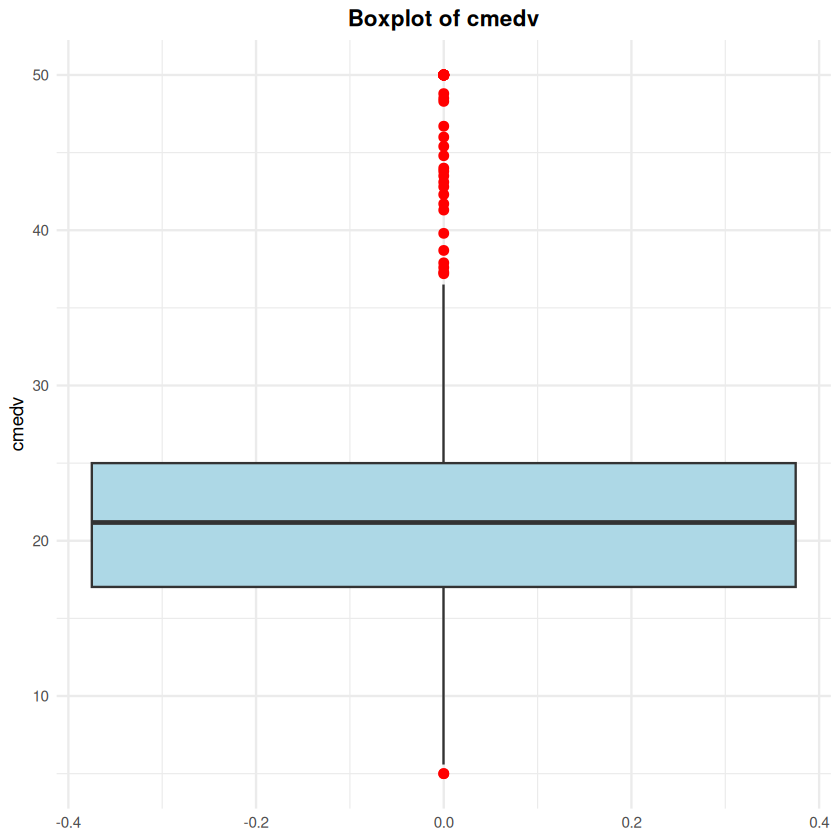

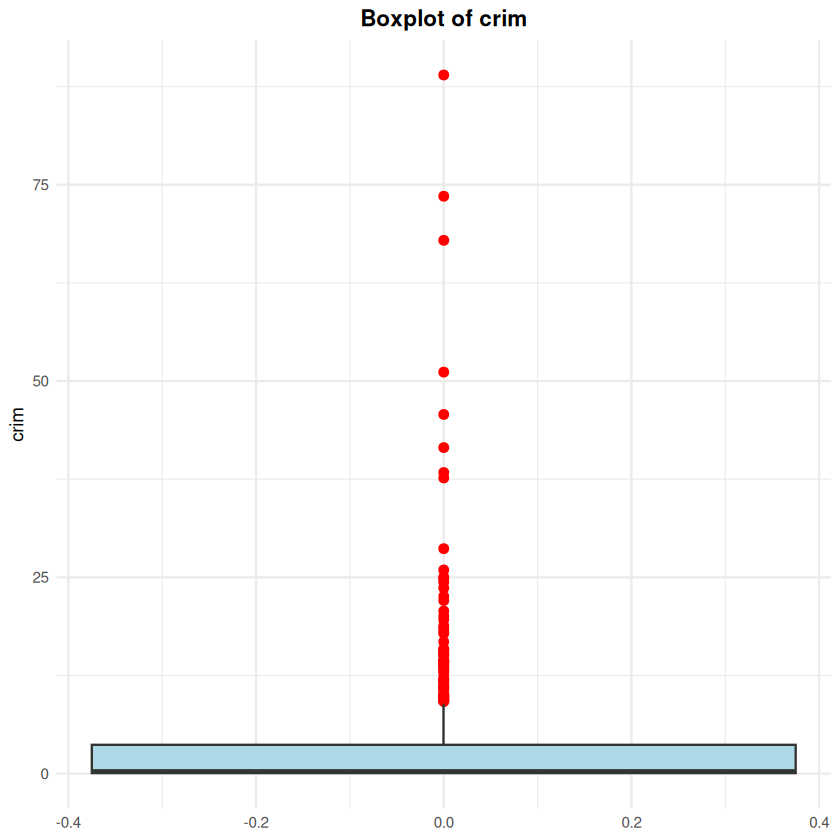

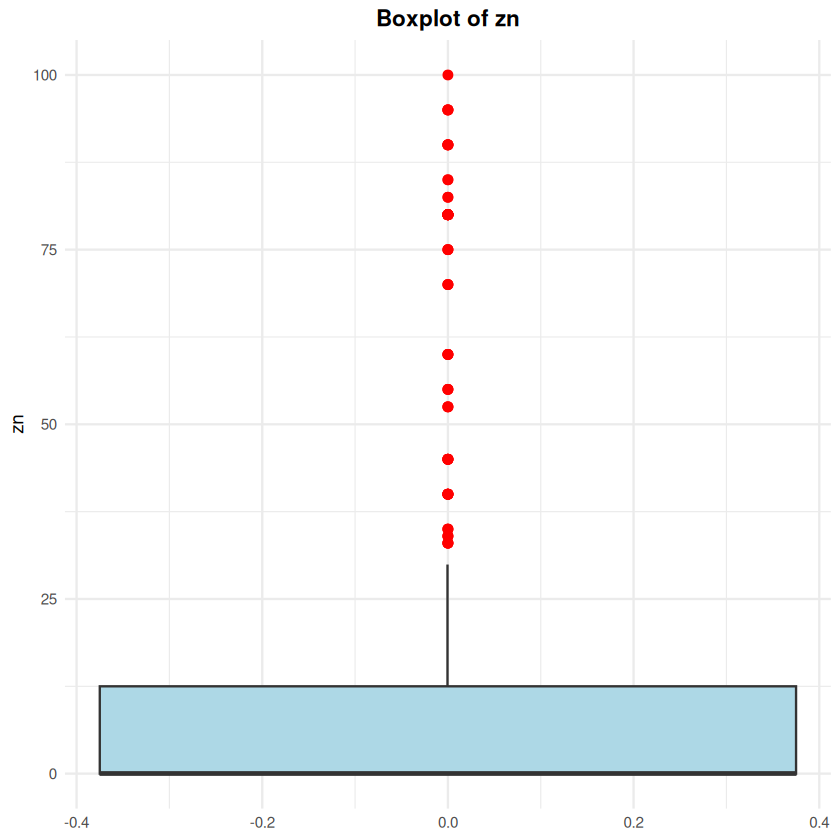

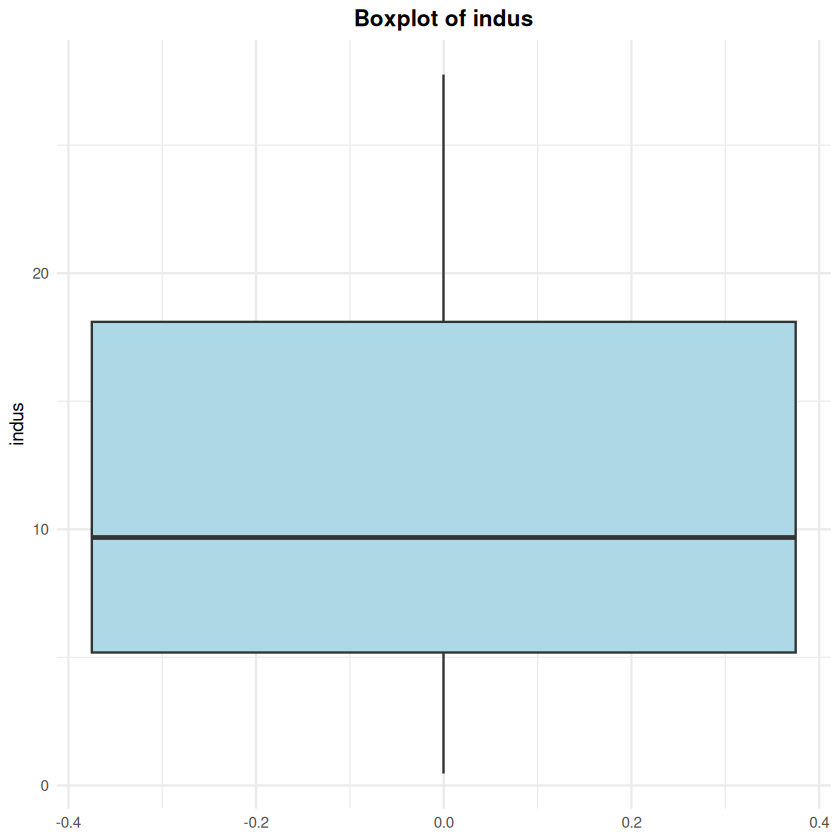

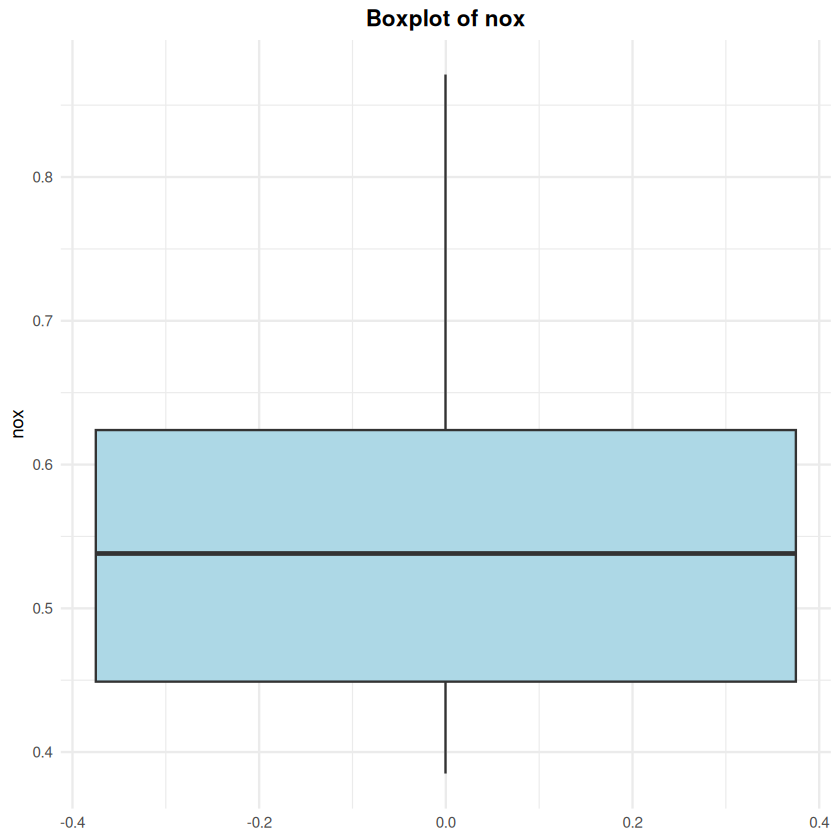

...

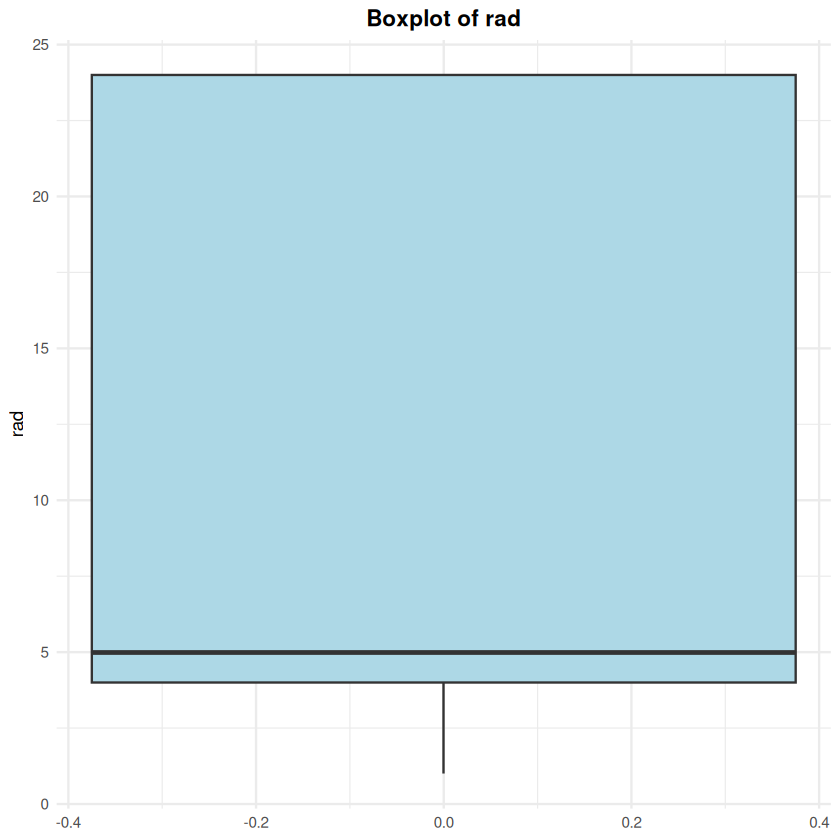

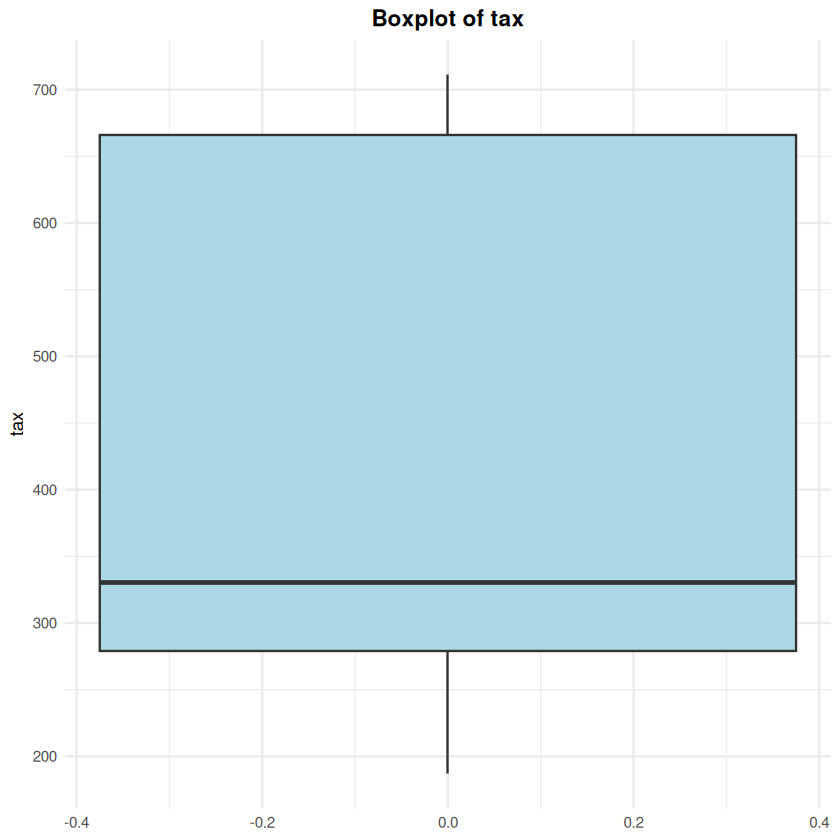

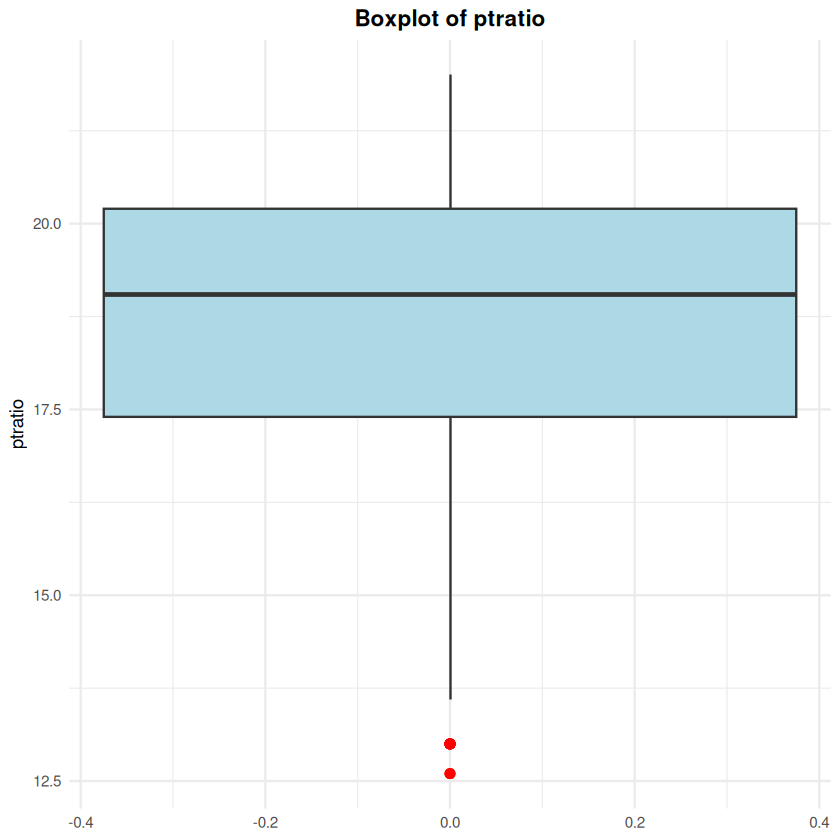

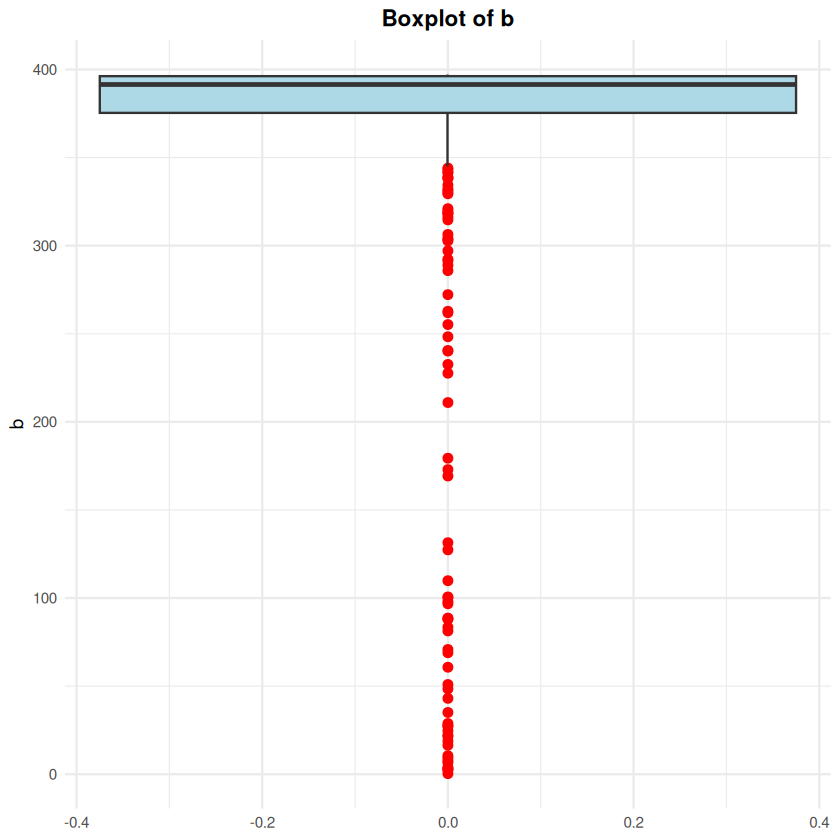

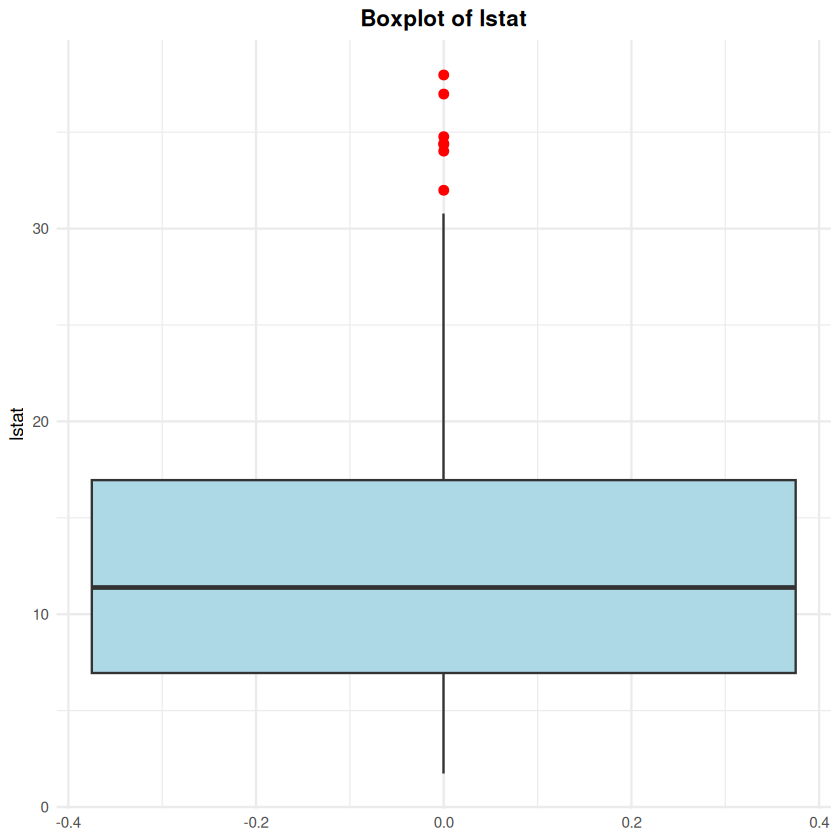

In [24]:
# Boxplots for Outlier Detection
boxplot_list <- list()
for (var in names(numerical_vars)[1:ncol(numerical_vars)]) {
  p <- ggplot(boston, aes_string(y = var)) +
    geom_boxplot(fill = "lightblue", outlier.color = "red", outlier.size = 2) +
    labs(title = paste("Boxplot of", var), y = var) +
    theme_minimal() +
    theme(plot.title = element_text(hjust = 0.5, face = "bold"))
  boxplot_list[[var]] <- p
}

# Display all plots one after the other
for (p in boxplot_list) {
  print(p)
}

## 3. Univariate Analysis - Categorical Variables

In [25]:
# Frequency tables for categorical variables
cat("\n=== CATEGORICAL VARIABLE FREQUENCIES ===\n")

if ("chas" %in% names(boston)) {
  cat("\nCharles River Dummy Variable (chas):\n")
  print(table(boston$chas))
  print(prop.table(table(boston$chas)) * 100)
}

if ("town" %in% names(boston)) {
  cat("\nTop 10 Towns by Frequency:\n")
  print(head(sort(table(boston$town), decreasing = TRUE), 10))
}


=== CATEGORICAL VARIABLE FREQUENCIES ===

Charles River Dummy Variable (chas):

  0   1 
471  35 

        0         1 
93.083004  6.916996 

Top 10 Towns by Frequency:

          Cambridge   Boston Savin Hill                Lynn      Boston Roxbury 
                 30                  23                  22                  19 
             Newton          Somerville Boston South Boston  Boston East Boston 
                 18                  15                  13                  12 
          Brookline              Quincy 
                 12                  12 


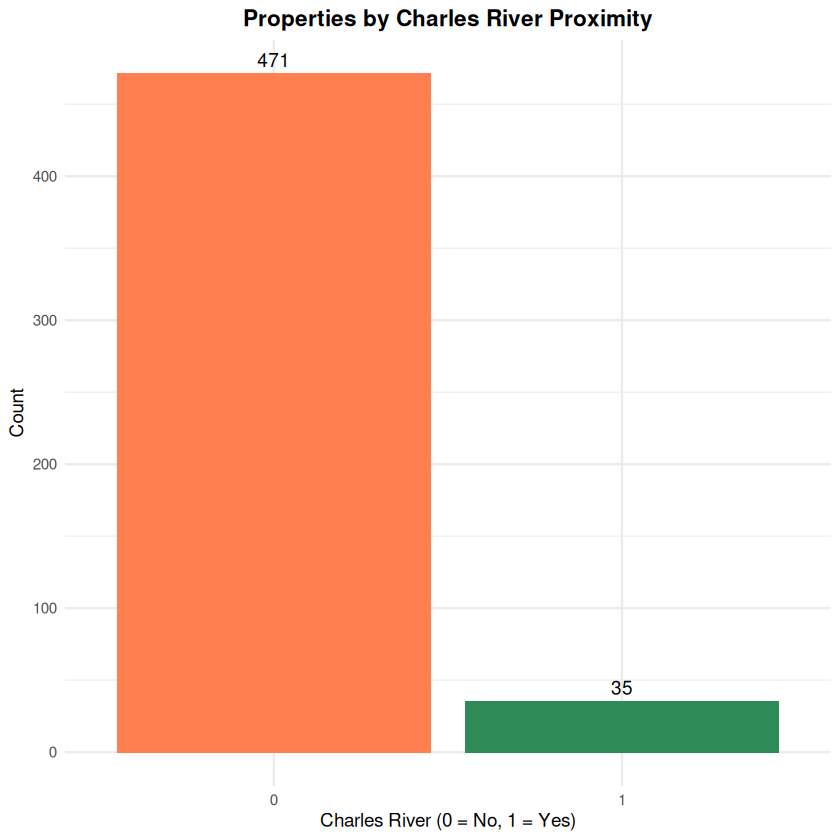

In [26]:
# Visualize Categorical Variables
if ("chas" %in% names(boston)) {
  ggplot(boston, aes(x = factor(chas), fill = factor(chas))) +
    geom_bar() +
    geom_text(stat = 'count', aes(label = after_stat(count)), vjust = -0.5) +
    labs(title = "Properties by Charles River Proximity",
         x = "Charles River (0 = No, 1 = Yes)",
         y = "Count") +
    scale_fill_manual(values = c("0" = "coral", "1" = "seagreen")) +
    theme_minimal() +
    theme(legend.position = "none", plot.title = element_text(hjust = 0.5, face = "bold"))
}

## 4. Bivariate Analysis

In [27]:
# Correlation Matrix
cat("\n=== CORRELATION ANALYSIS ===\n")
cor_matrix <- cor(numerical_vars, use = "complete.obs")
print(round(cor_matrix, 2))


=== CORRELATION ANALYSIS ===
        cmedv  crim    zn indus   nox    rm   age   dis   rad   tax ptratio
cmedv    1.00 -0.39  0.36 -0.48 -0.43  0.70 -0.38  0.25 -0.38 -0.47   -0.51
crim    -0.39  1.00 -0.20  0.41  0.42 -0.22  0.35 -0.38  0.63  0.58    0.29
zn       0.36 -0.20  1.00 -0.53 -0.52  0.31 -0.57  0.66 -0.31 -0.31   -0.39
indus   -0.48  0.41 -0.53  1.00  0.76 -0.39  0.64 -0.71  0.60  0.72    0.38
nox     -0.43  0.42 -0.52  0.76  1.00 -0.30  0.73 -0.77  0.61  0.67    0.19
rm       0.70 -0.22  0.31 -0.39 -0.30  1.00 -0.24  0.21 -0.21 -0.29   -0.36
age     -0.38  0.35 -0.57  0.64  0.73 -0.24  1.00 -0.75  0.46  0.51    0.26
dis      0.25 -0.38  0.66 -0.71 -0.77  0.21 -0.75  1.00 -0.49 -0.53   -0.23
rad     -0.38  0.63 -0.31  0.60  0.61 -0.21  0.46 -0.49  1.00  0.91    0.46
tax     -0.47  0.58 -0.31  0.72  0.67 -0.29  0.51 -0.53  0.91  1.00    0.46
ptratio -0.51  0.29 -0.39  0.38  0.19 -0.36  0.26 -0.23  0.46  0.46    1.00
b        0.33 -0.39  0.18 -0.36 -0.38  0.13 -0.27  0.29 -0

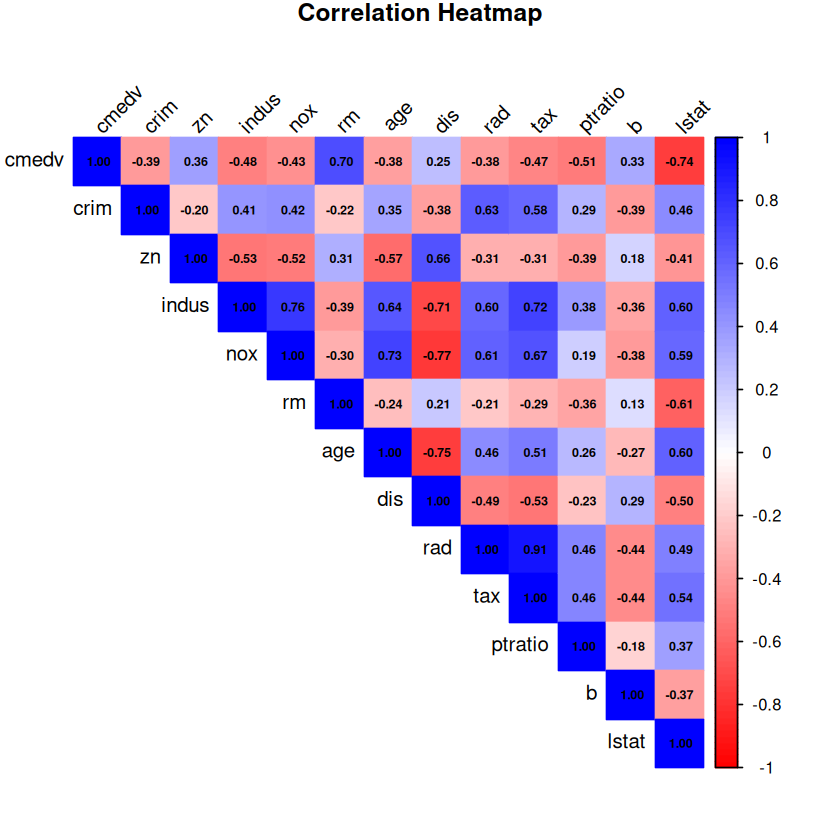

In [28]:
# Correlation Heatmap
corrplot(cor_matrix, method = "color", type = "upper",
         tl.col = "black", tl.srt = 45,
         addCoef.col = "black", number.cex = 0.6,
         col = colorRampPalette(c("red", "white", "blue"))(100),
         title = "Correlation Heatmap", mar = c(0,0,1,0))

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


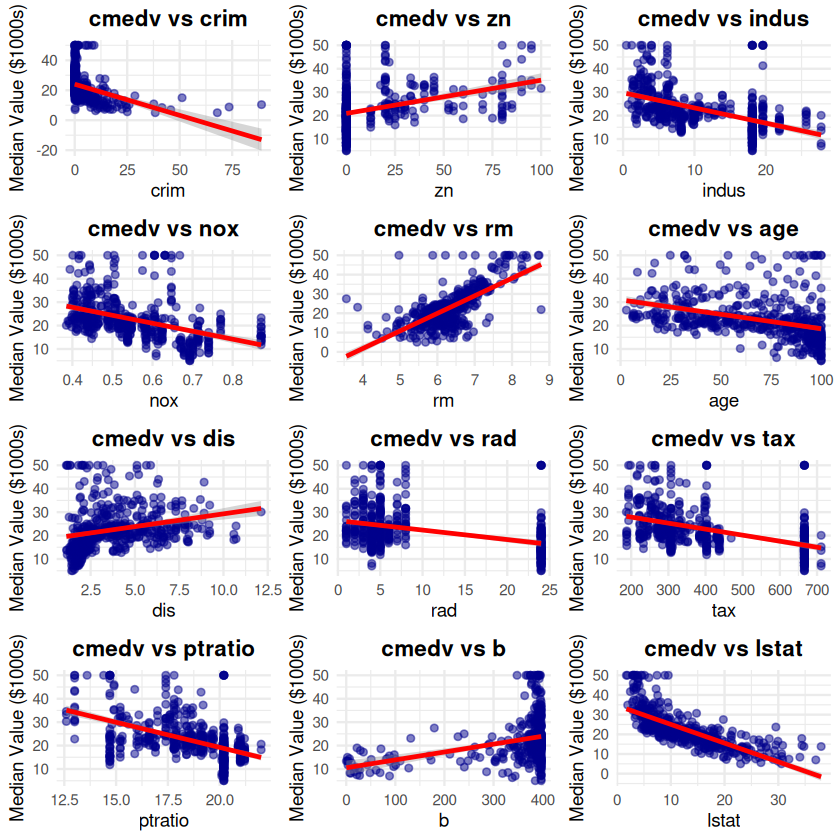

In [34]:
# Key Relationships with Target Variable (cmedv)
key_vars <- c("crim", "zn", "indus", "nox", "rm", "age", "dis", "rad", "tax", "ptratio", "b", "lstat")
scatter_plots <- list()

for (var in key_vars) {
  p <- ggplot(boston, aes_string(x = var, y = "cmedv")) +
    geom_point(alpha = 0.5, color = "darkblue") +
    geom_smooth(method = "lm", color = "red", se = TRUE) +
    labs(title = paste("cmedv vs", var), x = var, y = "Median Value ($1000s)") +
    theme_minimal() +
    theme(plot.title = element_text(hjust = 0.5, face = "bold"))
  scatter_plots[[var]] <- p
}

grid.arrange(grobs = scatter_plots, ncol = 3)

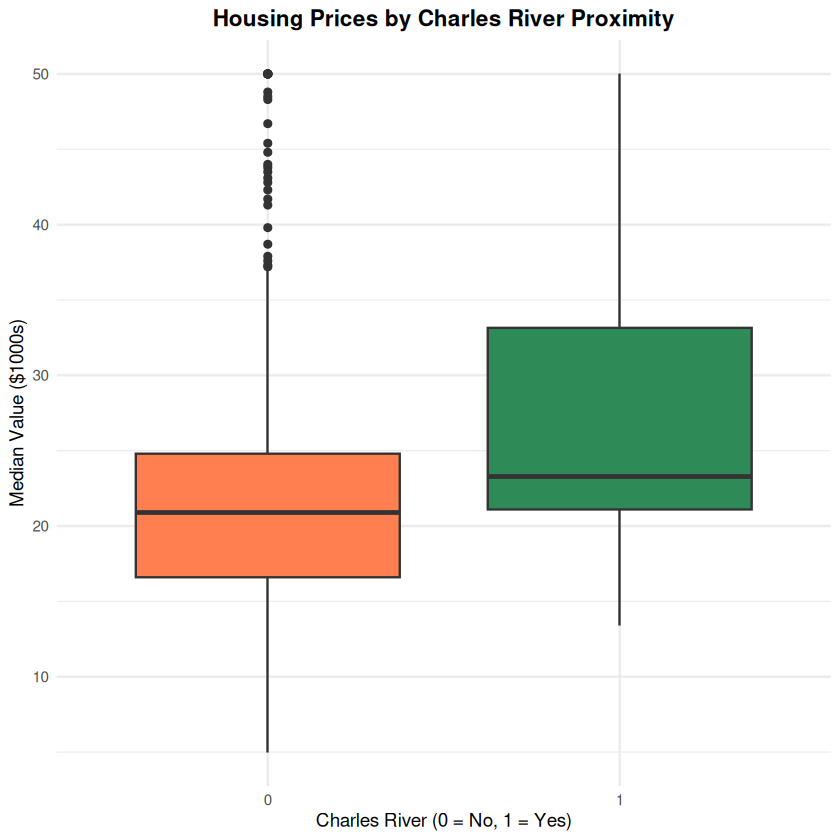

In [17]:
# Categorical vs Numerical: Charles River effect
if ("chas" %in% names(boston)) {
  ggplot(boston, aes(x = factor(chas), y = medv, fill = factor(chas))) +
    geom_boxplot() +
    labs(title = "Housing Prices by Charles River Proximity",
         x = "Charles River (0 = No, 1 = Yes)",
         y = "Median Value ($1000s)") +
    scale_fill_manual(values = c("0" = "coral", "1" = "seagreen")) +
    theme_minimal() +
    theme(legend.position = "none", plot.title = element_text(hjust = 0.5, face = "bold"))
}

## 6. Geographic Analysis

In [43]:
install.packages("ggspatial")

Installing package into ‘/home/kushal/R/x86_64-pc-linux-gnu-library/4.5’
(as ‘lib’ is unspecified)



also installing the dependency ‘rosm’




In [45]:
install.packages("prettymapr")

Installing package into ‘/home/kushal/R/x86_64-pc-linux-gnu-library/4.5’
(as ‘lib’ is unspecified)

also installing the dependency ‘rjson’




CMEDV


=== GEOGRAPHIC VISUALIZATION ===


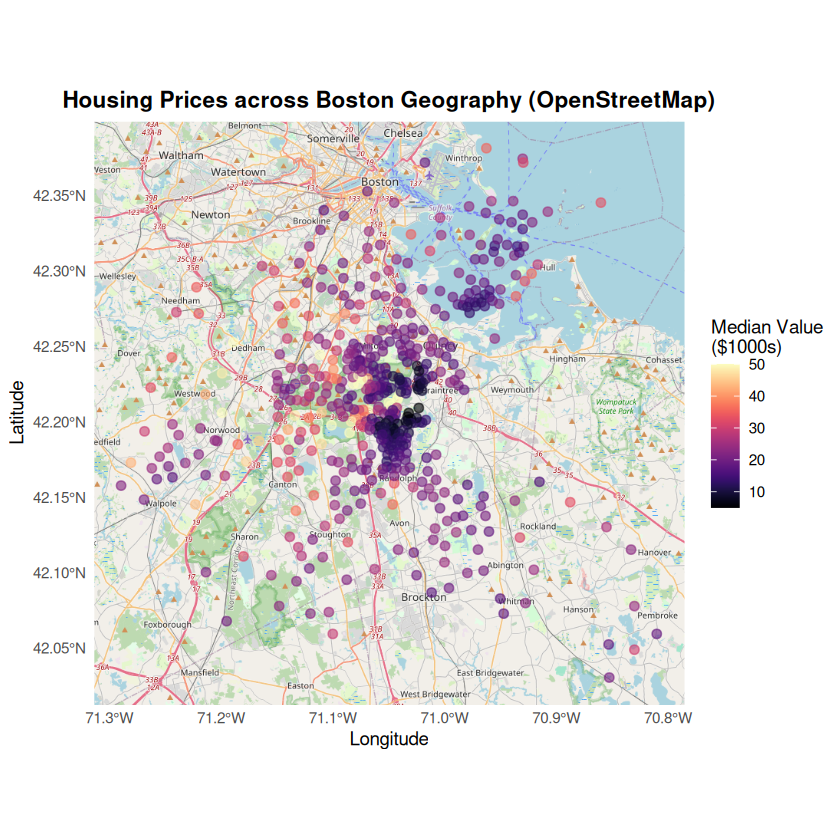

In [57]:
if (all(c("lon", "lat") %in% names(boston))) {
  library(ggplot2)
  library(viridis)
  library(ggspatial) # Required for annotation_map_tile and geom_spatial_point

  cat("\n=== GEOGRAPHIC VISUALIZATION ===\n")

  print(
    ggplot(boston, aes(x = lon, y = lat)) +
      # 1. Add OpenStreetMap background
      # 'type = "osm"' uses standard OpenStreetMap tiles (no key required).
      # 'zoomin = 0' ensures tiles aren't too blurry or too slow to load.
      annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +

      # 2. Plot Points
      # We use geom_spatial_point to handle projection automatically.
      # 'crs = 4326' tells R that our x/y are Longitude/Latitude.
      geom_spatial_point(aes(color = cmedv), crs = 4326, size = 2, alpha = 0.6) +

      # 3. Styling
      scale_color_viridis(option = "magma", name = "Median Value\n($1000s)") +
      labs(title = "Housing Prices across Boston Geography (OpenStreetMap)",
           x = "Longitude", y = "Latitude") +
      theme_minimal() +
      theme(plot.title = element_text(hjust = 0.5, face = "bold"))
  )
}

CRIM

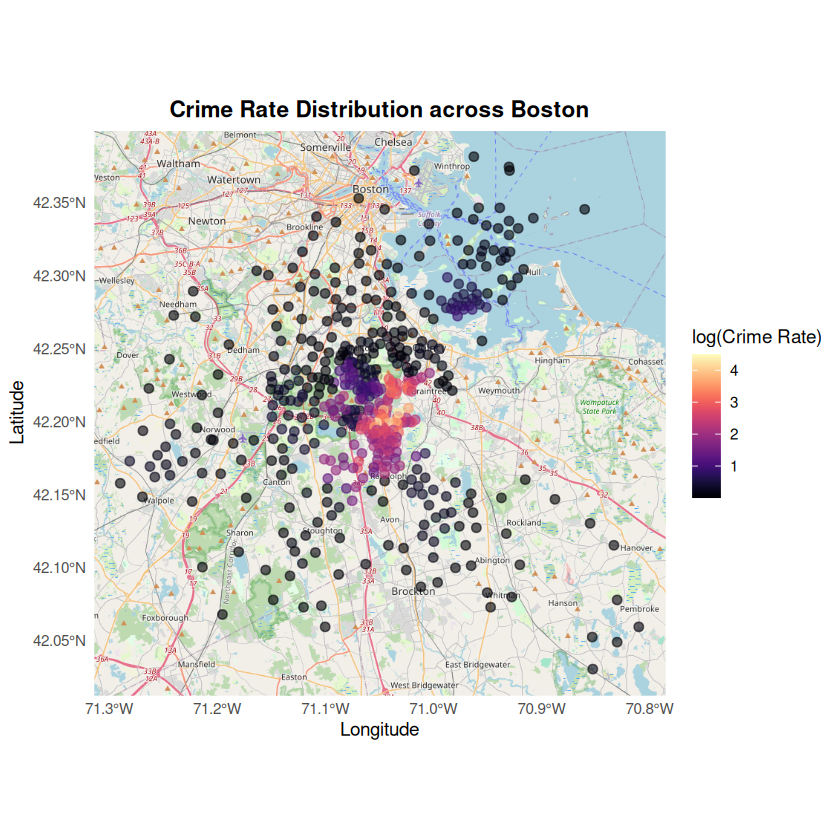

In [51]:
if (all(c("lon", "lat") %in% names(boston))) {
  library(ggplot2)
  library(viridis)
  library(ggspatial) # Required for annotation_map_tile and geom_spatial_point

  print(
    ggplot(boston, aes(x = lon, y = lat)) +
      # 1. Add OpenStreetMap background
      # 'type = "osm"' uses standard OpenStreetMap tiles (no key required).
      # 'zoomin = 0' ensures tiles aren't too blurry or too slow to load.
      annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +

      # 2. Plot Points
      # We use geom_spatial_point to handle projection automatically.
      # 'crs = 4326' tells R that our x/y are Longitude/Latitude.
      geom_spatial_point(aes(color = log(crim + 1)), crs = 4326, size = 2, alpha = 0.6) +

      # 3. Styling
    scale_color_viridis(option = "magma", name = "log(Crime Rate)") +
    labs(title = "Crime Rate Distribution across Boston",
         x = "Longitude", y = "Latitude") +
    theme_minimal() +
    theme(plot.title = element_text(hjust = 0.5, face = "bold")))
}



ZN

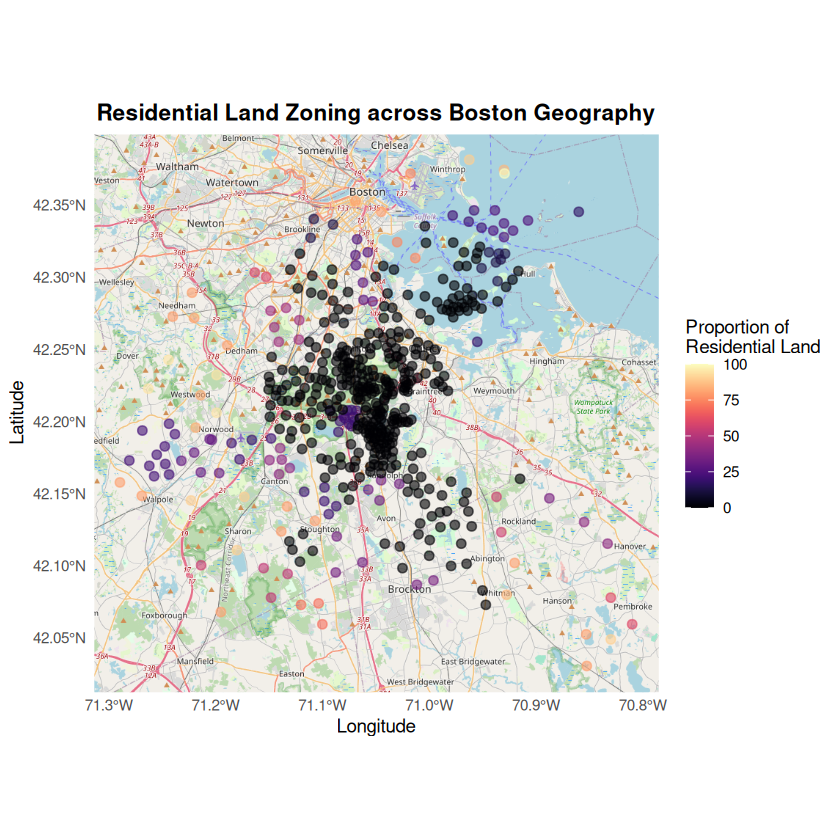

In [56]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = zn), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "magma", name = "Proportion of\nResidential Land") +
            labs(title = "Residential Land Zoning across Boston Geography",
                     x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


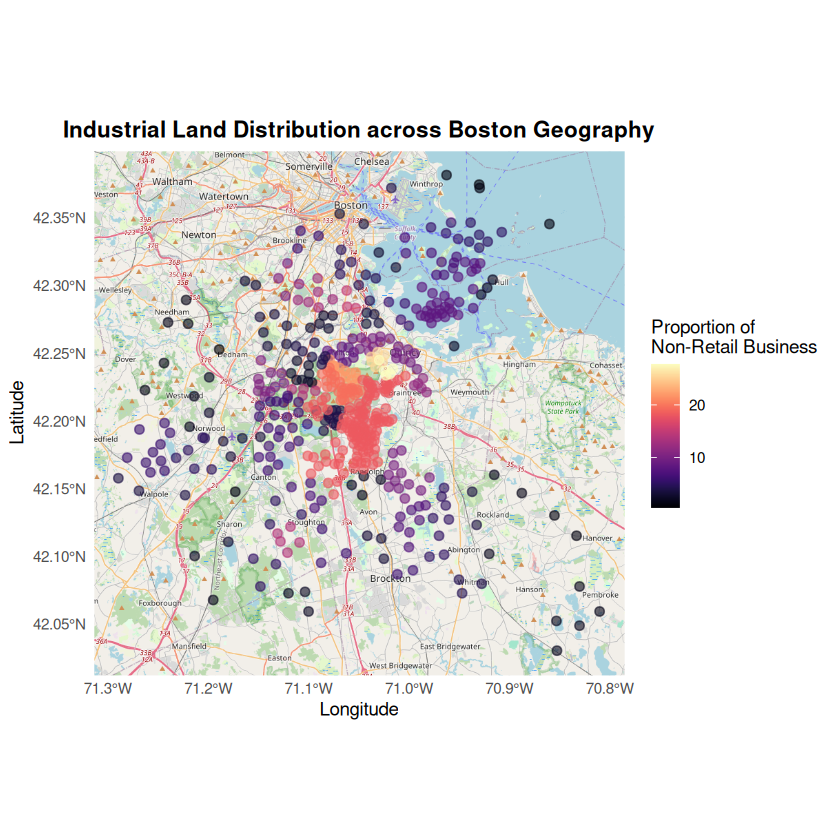

In [ ]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = indus), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "magmab", name = "Proportion of\nNon-Retail Business") +
            labs(title = "Industrial Land Distribution across Boston Geography",
                     x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


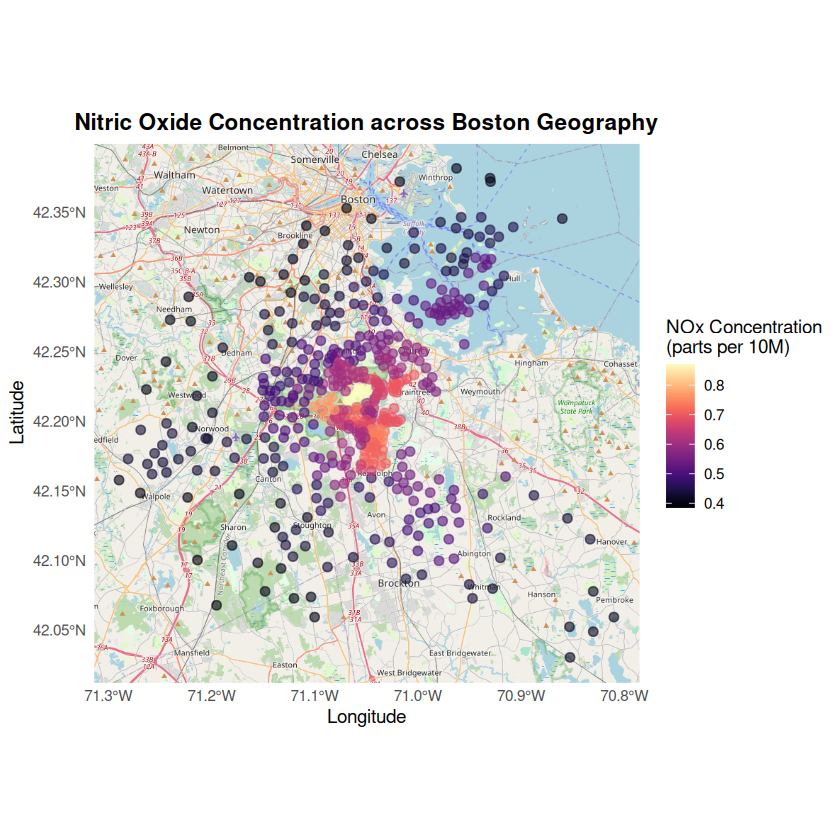

In [60]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = nox), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "magma", name = "NOx Concentration\n(parts per 10M)") +
            labs(title = "Nitric Oxide Concentration across Boston Geography",
                     x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


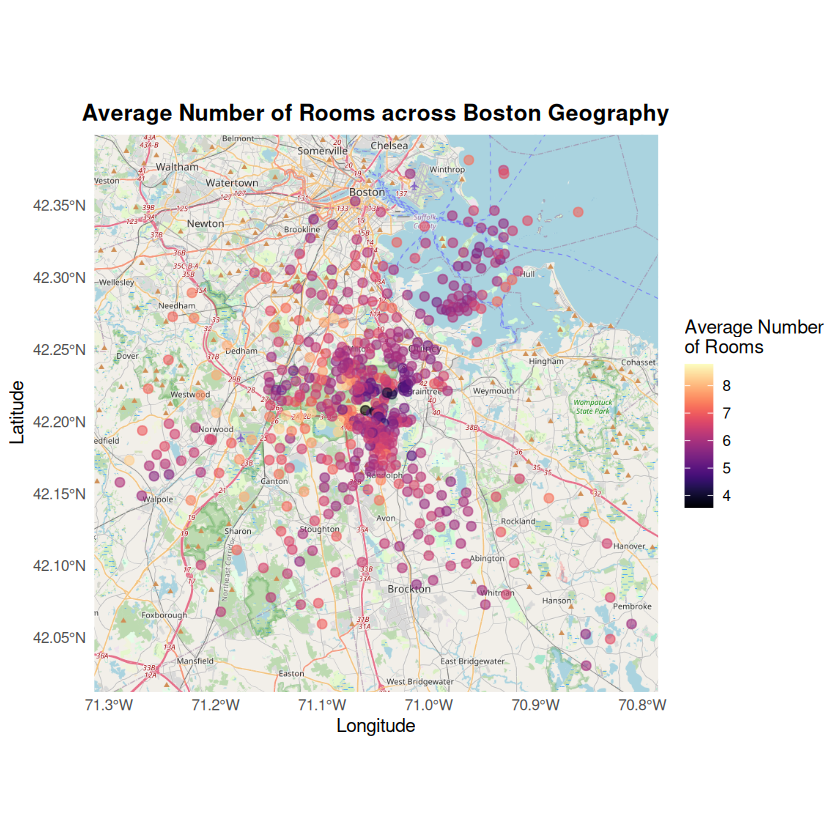

In [61]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = rm), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "magma", name = "Average Number\nof Rooms") +
            labs(title = "Average Number of Rooms across Boston Geography",
                     x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


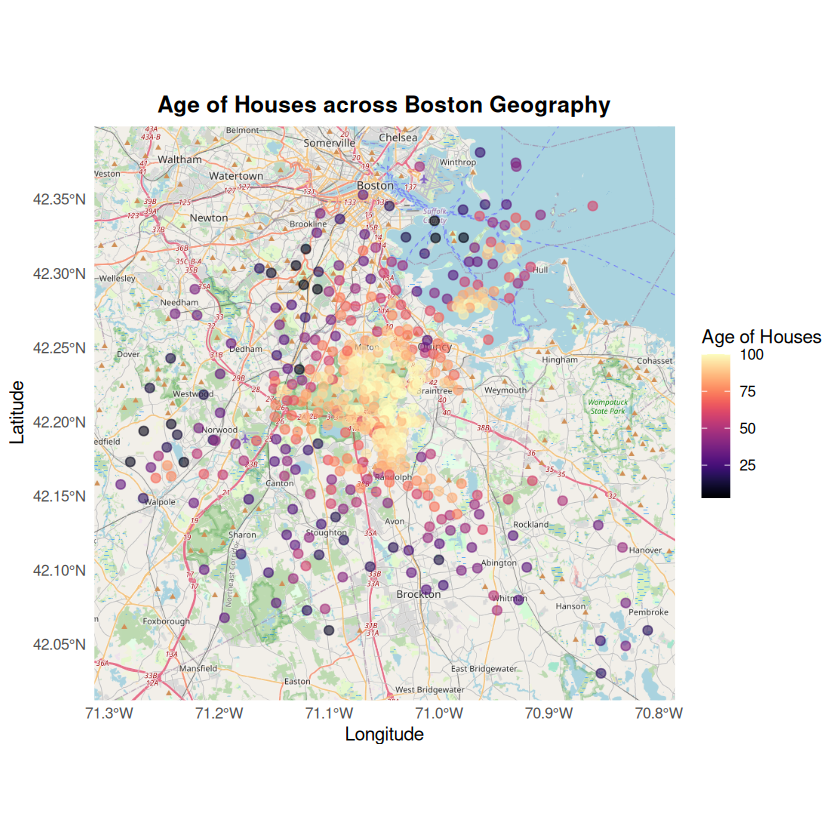

In [63]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = age), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "magma", name = "Age of Houses") +
            labs(title = "Age of Houses across Boston Geography",
                 x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


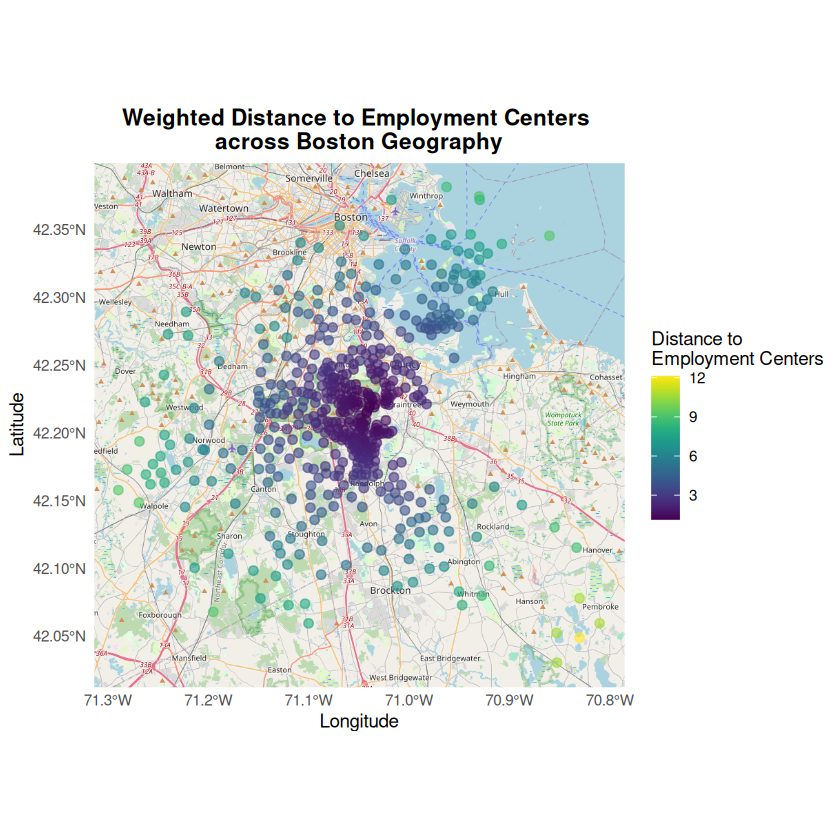

In [67]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = dis), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "viridis", name = "Distance to\nEmployment Centers") +
            labs(title = "Weighted Distance to Employment Centers \nacross Boston Geography",
                 x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


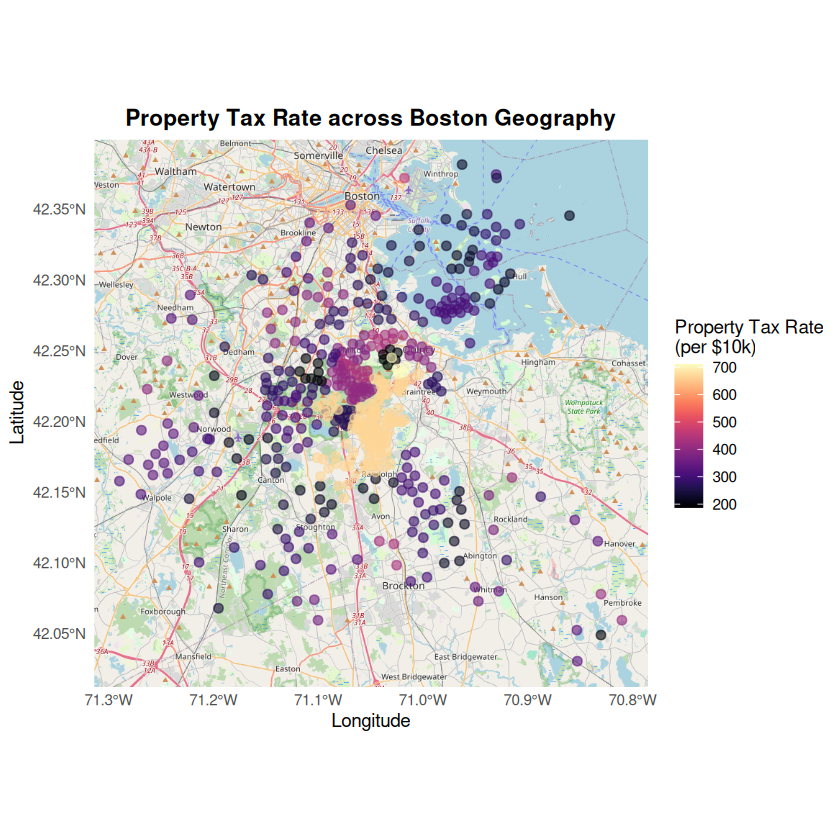

In [68]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = tax), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "magma", name = "Property Tax Rate\n(per $10k)") +
            labs(title = "Property Tax Rate across Boston Geography",
                 x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


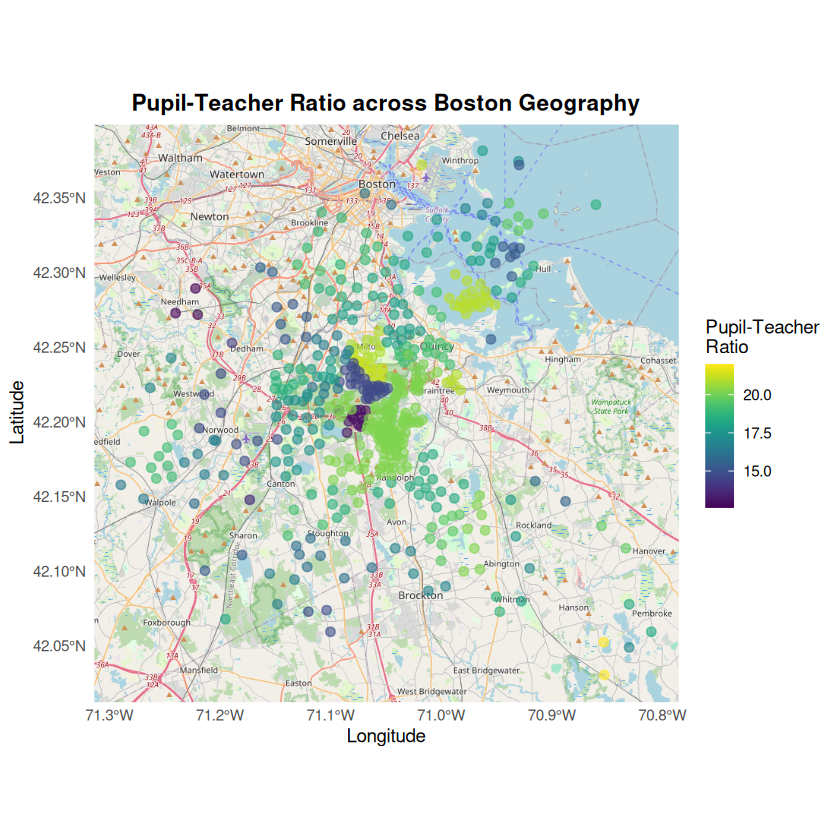

In [70]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = ptratio), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "viridis", name = "Pupil-Teacher\nRatio") +
            labs(title = "Pupil-Teacher Ratio across Boston Geography",
                 x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


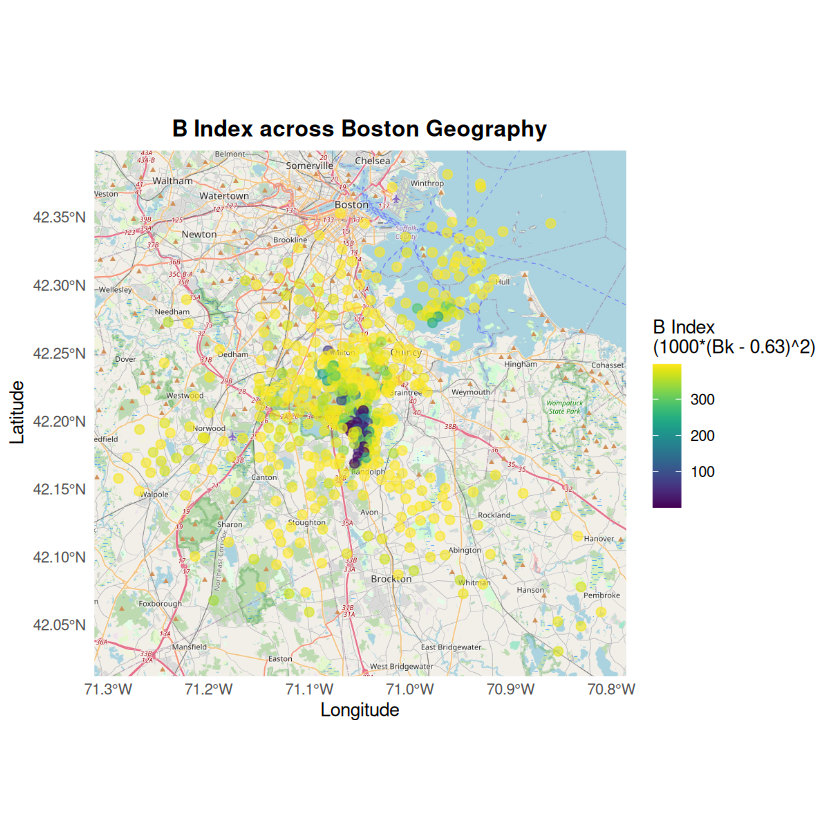

In [72]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = b), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "viridis", name = "B Index\n(1000*(Bk - 0.63)^2)") +
            labs(title = "B Index across Boston Geography",
                     x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


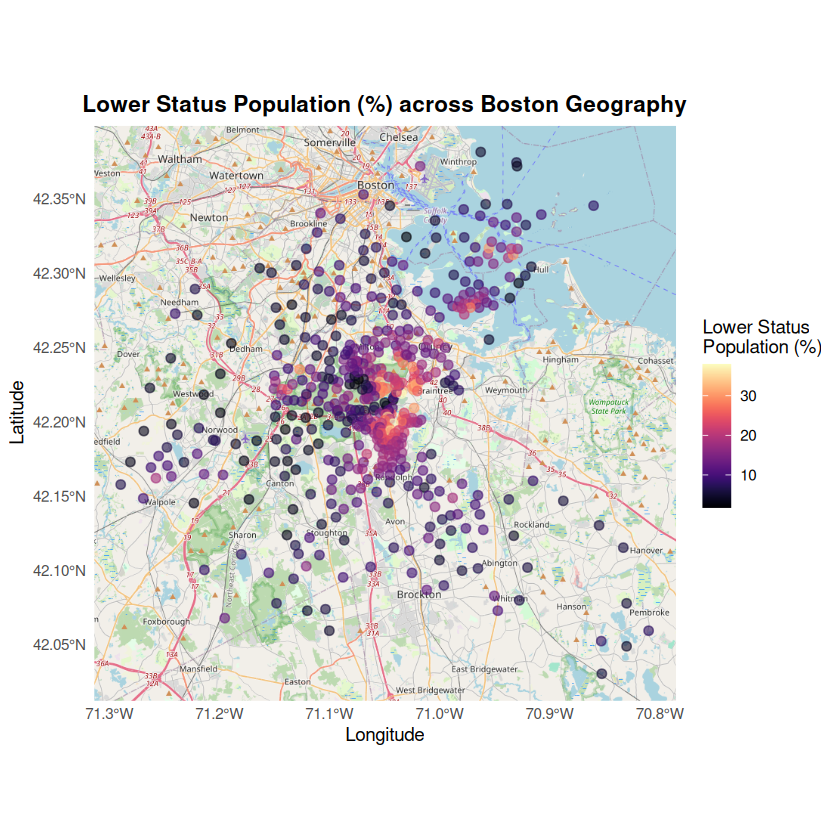

In [73]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = lstat), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "magma", name = "Lower Status\nPopulation (%)") +
            labs(title = "Lower Status Population (%) across Boston Geography",
                 x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


## 7. Outlier Detection

In [74]:
cat("\n=== OUTLIER DETECTION (IQR Method) ===\n")

detect_outliers <- function(x) {
  Q1 <- quantile(x, 0.25, na.rm = TRUE)
  Q3 <- quantile(x, 0.75, na.rm = TRUE)
  IQR_val <- Q3 - Q1
  lower <- Q1 - 1.5 * IQR_val
  upper <- Q3 + 1.5 * IQR_val
  outliers <- sum(x < lower | x > upper, na.rm = TRUE)
  return(outliers)
}

outlier_summary <- data.frame(
  Variable = names(numerical_vars),
  Outlier_Count = sapply(numerical_vars, detect_outliers),
  Outlier_Percent = round(sapply(numerical_vars, detect_outliers) / nrow(boston) * 100, 2)
)
print(outlier_summary[outlier_summary$Outlier_Count > 0, ])


=== OUTLIER DETECTION (IQR Method) ===


        Variable Outlier_Count Outlier_Percent
cmedv      cmedv            39            7.71
crim        crim            66           13.04
zn            zn            68           13.44
rm            rm            30            5.93
dis          dis             5            0.99
ptratio  ptratio            15            2.96
b              b            77           15.22
lstat      lstat             7            1.38


## 8. Feature Engineering

In [75]:
cat("\n=== FEATURE ENGINEERING ===\n")

boston_enhanced <- boston %>%
  mutate(
    # Crime rate categories
    crime_level = cut(crim,
                      breaks = c(-Inf, quantile(crim, c(0.33, 0.67)), Inf),
                      labels = c("Low", "Medium", "High")),

    # Room density (rooms per age unit)
    room_density = rm / (age + 1),

    # Accessibility index (combining rad and tax)
    accessibility_index = rad * tax / 1000,

    # Distance to employment (categorized)
    distance_category = cut(dis,
                           breaks = c(-Inf, 3, 5, Inf),
                           labels = c("Near", "Moderate", "Far")),

    # Large homes indicator
    large_home = ifelse(rm >= 7, 1, 0),

    # High crime indicator
    high_crime = ifelse(crim > median(crim), 1, 0)
  )

cat("New features created successfully!\n")
cat(paste("New columns:", paste(setdiff(names(boston_enhanced), names(boston)), collapse = ", "), "\n"))


=== FEATURE ENGINEERING ===
New features created successfully!
New columns: crime_level, room_density, accessibility_index, distance_category, large_home, high_crime 


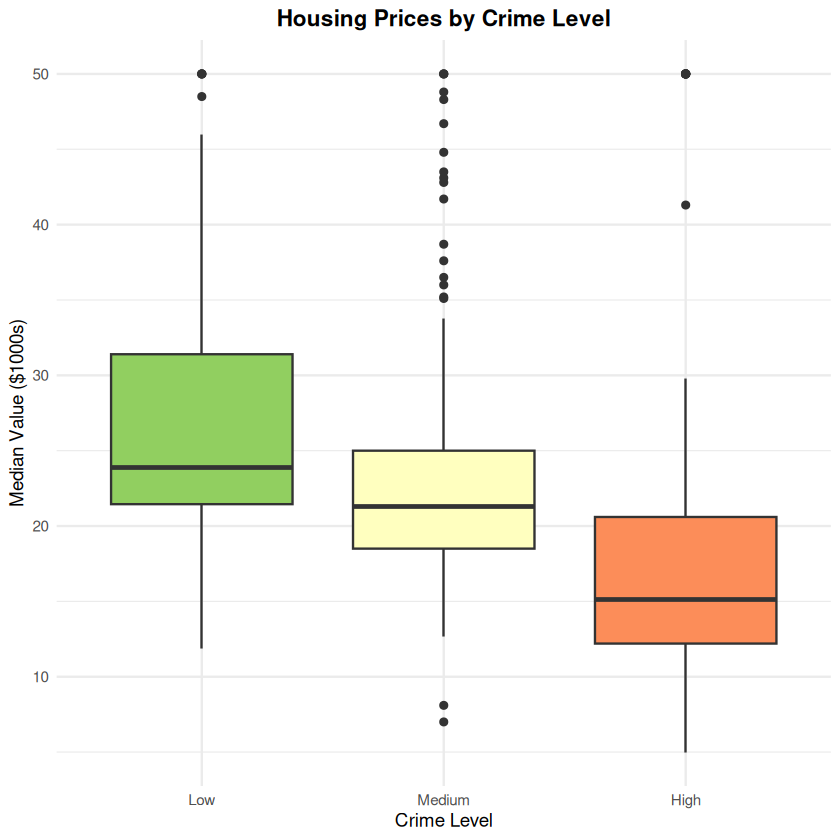

In [76]:
# Visualize new features
ggplot(boston_enhanced, aes(x = crime_level, y = medv, fill = crime_level)) +
  geom_boxplot() +
  labs(title = "Housing Prices by Crime Level",
       x = "Crime Level", y = "Median Value ($1000s)") +
  scale_fill_brewer(palette = "RdYlGn", direction = -1) +
  theme_minimal() +
  theme(legend.position = "none", plot.title = element_text(hjust = 0.5, face = "bold"))

## 9. Statistical Tests

In [24]:
cat("\n=== STATISTICAL TESTS ===\n")

# Normality Tests (Shapiro-Wilk for sample)
cat("\nNormality Tests (Shapiro-Wilk) for Key Variables:\n")
test_vars <- c("medv", "rm", "lstat", "crim")
for (var in test_vars) {
  if (var %in% names(boston)) {
    sample_data <- sample(boston[[var]], min(5000, length(boston[[var]])))
    test_result <- shapiro.test(sample_data)
    cat(paste(var, ": W =", round(test_result$statistic, 4),
              ", p-value =", format(test_result$p.value, scientific = TRUE), "\n"))
  }
}


=== STATISTICAL TESTS ===

Normality Tests (Shapiro-Wilk) for Key Variables:
medv : W = 0.9172 , p-value = 4.941386e-16 
rm : W = 0.9609 , p-value = 2.411977e-10 
lstat : W = 0.9369 , p-value = 8.286632e-14 
crim : W = 0.45 , p-value = 1.328589e-36 


In [25]:
# Correlation Significance
cat("\nSignificant Correlations with medv (p < 0.05):\n")
cor_tests <- lapply(names(numerical_vars)[names(numerical_vars) != "medv"], function(var) {
  test <- cor.test(boston$medv, boston[[var]])
  data.frame(Variable = var,
             Correlation = round(test$estimate, 3),
             P_value = format(test$p.value, scientific = TRUE))
})
cor_test_df <- do.call(rbind, cor_tests) %>% arrange(desc(abs(Correlation)))
print(cor_test_df)


Significant Correlations with medv (p < 0.05):
      Variable Correlation      P_value
cor3     cmedv       0.998        0e+00
cor15    lstat      -0.738 5.081103e-88
cor8        rm       0.695 2.487229e-74
cor13  ptratio      -0.508 1.609509e-34
cor6     indus      -0.484  4.90026e-31
cor12      tax      -0.469 5.637734e-29
cor7       nox      -0.427 7.065042e-24
cor      tract       0.426 9.070375e-24
cor4      crim      -0.388 1.173987e-19
cor11      rad      -0.382 5.465933e-19
cor9       age      -0.377 1.569982e-18
cor5        zn       0.360 5.713584e-17
cor14        b       0.333 1.318113e-14
cor1       lon      -0.321 1.456311e-13
cor10      dis       0.250 1.206612e-08
cor2       lat       0.010 8.283904e-01


In [26]:
# ANOVA for categorical variables
if ("chas" %in% names(boston)) {
  cat("\nANOVA: Effect of Charles River on Housing Prices:\n")
  anova_result <- aov(medv ~ factor(chas), data = boston)
  print(summary(anova_result))
}


ANOVA: Effect of Charles River on Housing Prices:
              Df Sum Sq Mean Sq F value   Pr(>F)    
factor(chas)   1   1312  1312.1   15.97 7.39e-05 ***
Residuals    504  41404    82.2                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


## 10. Key Insights Summary

In [27]:
cat("\n=== KEY INSIGHTS ===\n")
cat("1. Target Variable (medv) Range:", range(boston$medv, na.rm = TRUE)[1], "-",
    range(boston$medv, na.rm = TRUE)[2], "$1000s\n")
cat("2. Strongest Positive Correlation with medv:",
    names(which.max(cor_matrix["medv", cor_matrix["medv",] != 1])), "\n")
cat("3. Strongest Negative Correlation with medv:",
    names(which.min(cor_matrix["medv",])), "\n")
cat("4. Most Skewed Variable:",
    skew_kurt$Variable[which.max(abs(skew_kurt$Skewness))], "\n")
cat("5. Variable with Most Outliers:",
    outlier_summary$Variable[which.max(outlier_summary$Outlier_Count)], "\n")

cat("\n=== EDA COMPLETE ===\n")


=== KEY INSIGHTS ===
1. Target Variable (medv) Range: 5 - 50 $1000s
2. Strongest Positive Correlation with medv: cmedv 
3. Strongest Negative Correlation with medv: lstat 
4. Most Skewed Variable: crim 
5. Variable with Most Outliers: b 

=== EDA COMPLETE ===
